<a href="https://colab.research.google.com/github/kwon020424/yolov5/blob/main/yolov5_learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**<h1> 구글 드라이브 연동 </h1>**
구글 드라이브와 연동하여 사용하면 이후에 다시 프로젝트를 로드할 때 편합니다.

In [2]:
# prompt: 구글 드라이브랑 연결

from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
%cd /content/drive/MyDrive

/content/drive/MyDrive


In [4]:
%pwd

'/content/drive/MyDrive'

**<h1>yolov5 설치</h1>**
yolov5 깃 서버에 접속하여 다운로드하고
Requirements.txt파일로 필요한 라이브러리들을 일괄 설치하는 과정입니다.

In [5]:
# 기존에 설치를 완료한 경우에는 해당 경로로 이동만 하면 됩니다.
%cd /content/drive/MyDrive/yolov5

/content/drive/MyDrive/yolov5


In [ ]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies

Cloning into 'yolov5'...
remote: Enumerating objects: 17045, done.
remote: Counting objects: 100% (23/23), done.
remote: Compressing objects: 100% (15/15), done.
remote: Total 17045 (delta 10), reused 18 (delta 8), pack-reused 17022 (from 1)
Receiving objects: 100% (17045/17045), 15.67 MiB | 15.94 MiB/s, done.
Resolving deltas: 100% (11704/11704), done.
/content/drive/MyDrive/yolov5


In [1]:
!pip install Pillow==10.3

**<h1>이미지 파일 관리</h1>**
이미지 파일을 관리하기 위한 폴더를 생성합니다.

In [ ]:
!mkdir -p Train/labels
!mkdir -p Train/images
!mkdir -p Val/labels
!mkdir -p Val/images

라벨 폴더와 이미지 폴더를 만든 후 yolov5 폴더를 선택하여 각각의 폴더에 이미지를 넣습니다.

그 후 yolov5 폴더에 가이드와 함께 제공된 **yolov5n.pt** 파일과 라벨링한 class의 이름에 맞게 수정한 **data.yaml** 파일을 넣습니다.

In [6]:
import os
import shutil
from sklearn.model_selection import train_test_split

In [ ]:
##데이터를 학습용 : 검증용 7:3 검증 데이터 만들기
import os
import shutil
from sklearn.model_selection import train_test_split

def create_validation_set(train_path, val_path, split_ratio=0.3):
  """
  Train 데이터의 일부를 Val로 이동
  """
  #필요한 디렉토리 생성
  os.makedirs(os.path.join(val_path, 'images'), exist_ok=True)
  os.makedirs(os.path.join(val_path, 'labels'), exist_ok=True)

  #Train 이미지 리스트 가져오기
  train_images = os.listdir(os.path.join(train_path, 'images'))
  train_images = [f for f in train_images if f.endswith(('.jpg','.jpeg','.png'))]

  #Train 이미지를 Train, Val로 분할
  _, val_images = train_test_split(train_images, test_size=split_ratio, random_state=42)

  #Val로 파일 복사
  for img in val_images:
    #이미지 복사
    src_image = os.path.join(train_path, 'images', img)
    dst_image = os.path.join(val_path, 'images', img)
    shutil.copy(src_image, dst_image)
    # 라벨 파일 복사
    label_file = os.path.splitext(img)[0] + '.txt'
    src_label = os.path.join(train_path, 'labels', label_file)
    dst_label = os.path.join(val_path, 'labels', label_file)
    if os.path.exists(src_label):
      shutil.copy(src_label, dst_label)

  print(f"Validation set created with {len(val_images)} images.")

#실행
train_path = '/content/drive/MyDrive/yolov5/Train'
val_path = '/content/drive/MyDrive/yolov5/Val'

create_validation_set(train_path, val_path)

In [ ]:
def check_dataset():
  train_path = '/content/drive/MyDrive/yolov5/Train'
  val_path = '/content/drive/MyDrive/yolov5/Val'

  #Train 데이터셋 확인
  train_images = len(os.listdir(os.path.join(train_path, 'images')))
  train_labels = len(os.listdir(os.path.join(train_path, 'labels')))

  #Val 데이터셋 확인
  val_images = len(os.listdir(os.path.join(val_path, 'images')))
  val_labels = len(os.listdir(os.path.join(val_path, 'labels')))

  print("Dataset status:")
  print(f"Train - Images: {train_images}, {train_labels}")
  print(f"Val - Images: {val_images}, Labels: {val_labels}")

check_dataset()

Dataset status:
Train - Images: 983, 983
Val - Images: 295, Labels: 295


**<h1>yolov5 모델 학습 시작</h1>**

In [7]:
#필요 라이브러리 임포트하기
import torch
import os
from IPython.display import Image, clear_output  # to display images

In [8]:
%pwd

'/content/drive/MyDrive/yolov5'

In [9]:
import numpy as np
import tensorflow as tf
import os
from PIL import Image
from tensorflow.python.eager.context import eager_mode

def _preproc(image, output_height=512, output_width=512, resize_side=512):
    ''' imagenet-standard: aspect-preserving resize to 256px smaller-side, then central-crop to 224px'''
    with eager_mode():
        h, w = image.shape[0], image.shape[1]
        scale = tf.cond(tf.less(h, w), lambda: resize_side / h, lambda: resize_side / w)
        resized_image = tf.compat.v1.image.resize_bilinear(tf.expand_dims(image, 0), [int(h*scale), int(w*scale)])
        cropped_image = tf.compat.v1.image.resize_with_crop_or_pad(resized_image, output_height, output_width)
        return tf.squeeze(cropped_image)

def Create_npy(imagespath, imgsize, ext) :
    images_list = [img_name for img_name in os.listdir(imagespath) if
                os.path.splitext(img_name)[1].lower() == '.'+ext.lower()]
    calib_dataset = np.zeros((len(images_list), imgsize, imgsize, 3), dtype=np.float32)

    for idx, img_name in enumerate(sorted(images_list)):
        img_path = os.path.join(imagespath, img_name)
        try:
            # 파일 크기가 정상적인지 확인
            if os.path.getsize(img_path) == 0:
                print(f"Error: {img_path} is empty.")
                continue

            img = Image.open(img_path)
            img = img.convert("RGB")  # RGBA 이미지 등 다른 형식이 있을 경우 강제로 RGB로 변환
            img_np = np.array(img)

            img_preproc = _preproc(img_np, imgsize, imgsize, imgsize)
            calib_dataset[idx,:,:,:] = img_preproc.numpy().astype(np.uint8)
            print(f"Processed image {img_path}")

        except Exception as e:
            print(f"Error processing image {img_path}: {e}")

    np.save('calib_set.npy', calib_dataset)



In [10]:
# "cannot identify image file" 에러가 발생하는 경우, PILLOW Version을 "!pip install Pillow==10.1" 로 변경하여 설치합니다.
Create_npy('./Train/images', 512, 'jpg')

In [ ]:
#모델 학습하기
!python train.py  --img 512 --batch 16 --epochs 300 --data /content/drive/MyDrive/yolov5/data.yaml --weights yolov5n.pt --cache

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
    261/299      1.58G    0.01114   0.004161  0.0001304         71        512:  34% 21/62 [00:04<00:07,  5.15it/s]/content/drive/MyDrive/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
    261/299      1.58G    0.01117   0.004254  0.0001302         92        512:  35% 22/62 [00:04<00:07,  5.00it/s]/content/drive/MyDrive/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
    261/299      1.58G    0.01109   0.004271  0.0001306         53        512:  37% 23/62 [00:04<00:08,  4.73it/s]/content/drive/MyDrive/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
    261/29

**<h1>yolov5 모델 학습 결과 검증</h1>**

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 512 --conf 0.1 --source /content/drive/MyDrive/yolov5/Train/images

Traceback (most recent call last):
  File "/content/drive/MyDrive/yolov5/detect.py", line 46, in <module>
    from ultralytics.utils.plotting import Annotator, colors, save_one_box
ModuleNotFoundError: No module named 'ultralytics'


In [ ]:
!pip install ultralytics

In [ ]:
!python detect.py --weights /content/drive/MyDrive/yolov5/runs/train/exp/weights/best.pt --img 512 --conf 0.1 --source /content/drive/MyDrive/video.mp4

detect: weights=['/content/drive/MyDrive/yolov5/runs/train/exp/weights/best.pt'], source=/content/drive/MyDrive/video.mp4, data=data/coco128.yaml, imgsz=[512, 512], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-383-g1435a8ee Python-3.10.12 torch-2.5.0+cu121 CPU

Fusing layers... 
Model summary: 157 layers, 1763224 parameters, 0 gradients, 4.1 GFLOPs
video 1/1 (1/3984) /content/drive/MyDrive/video.mp4: 512x512 4 potholes, 106.3ms
video 1/1 (2/3984) /content/drive/MyDrive/video.mp4: 512x512 5 potholes, 105.0ms
video 1/1 (3/3984) /content/drive/MyDrive/video.mp4: 512x512 5 potholes, 100.9ms
video 1/1 (4/3984) /content/drive/MyDrive/video.mp4: 5

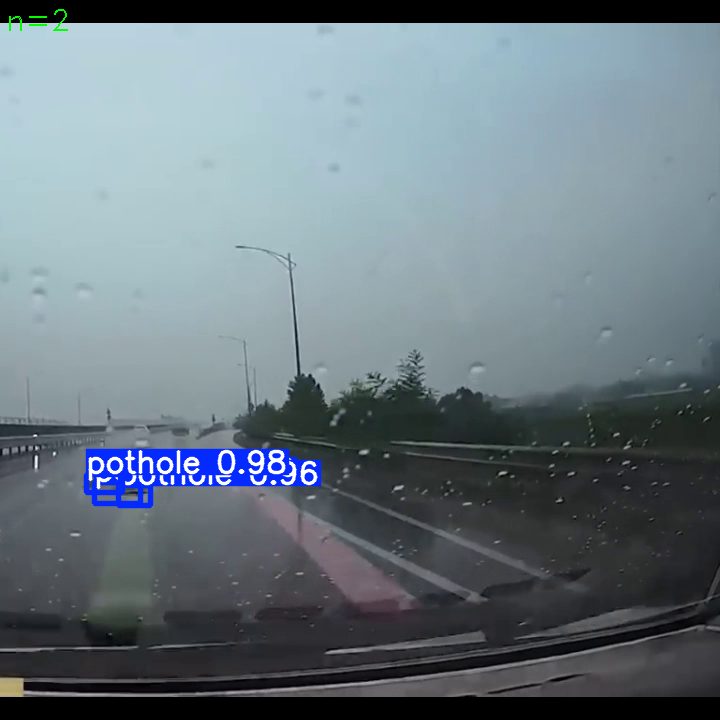

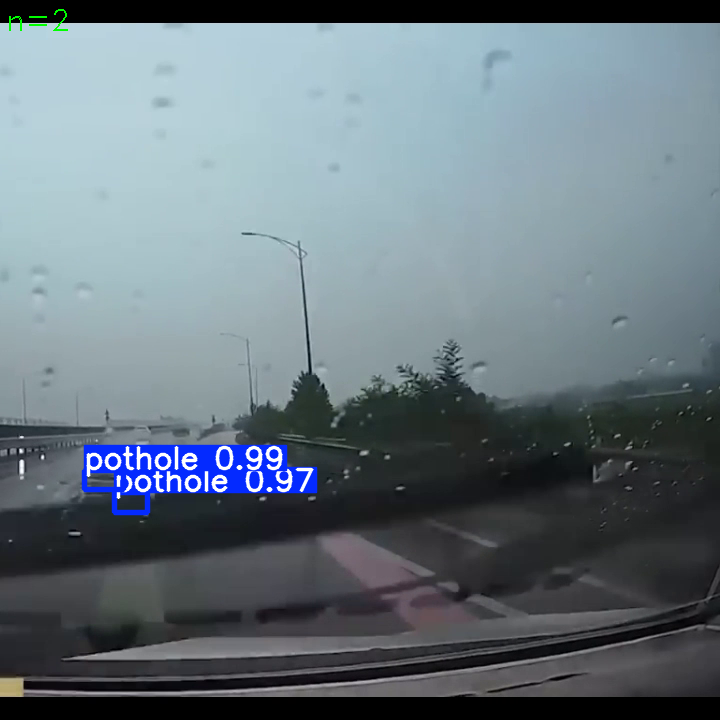

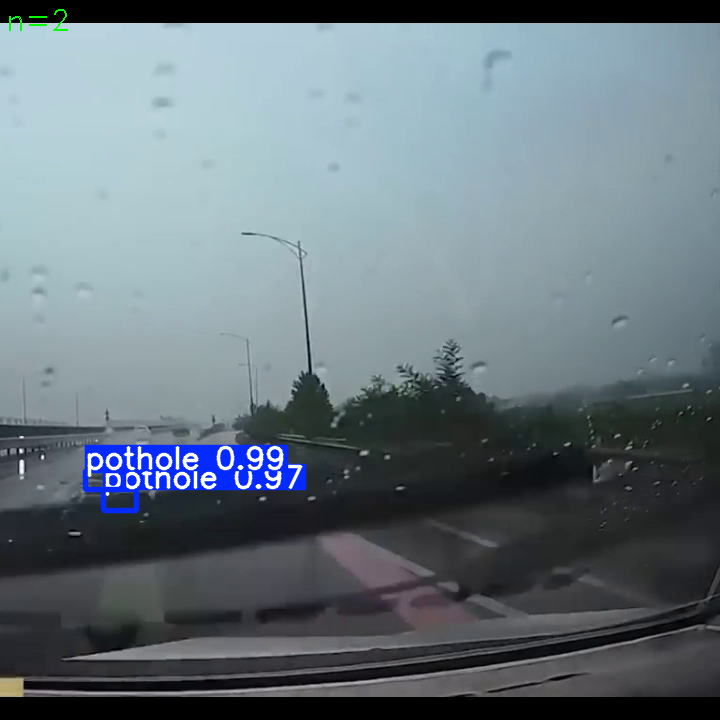

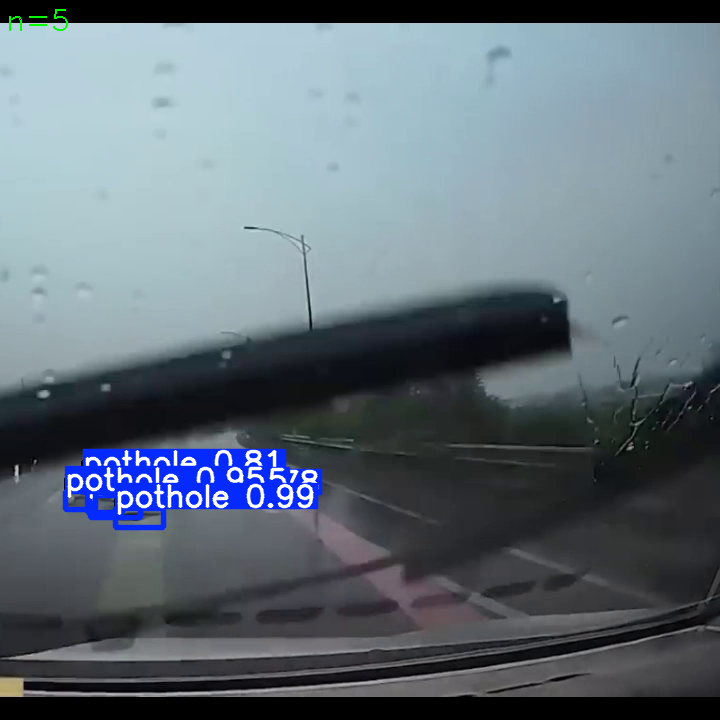

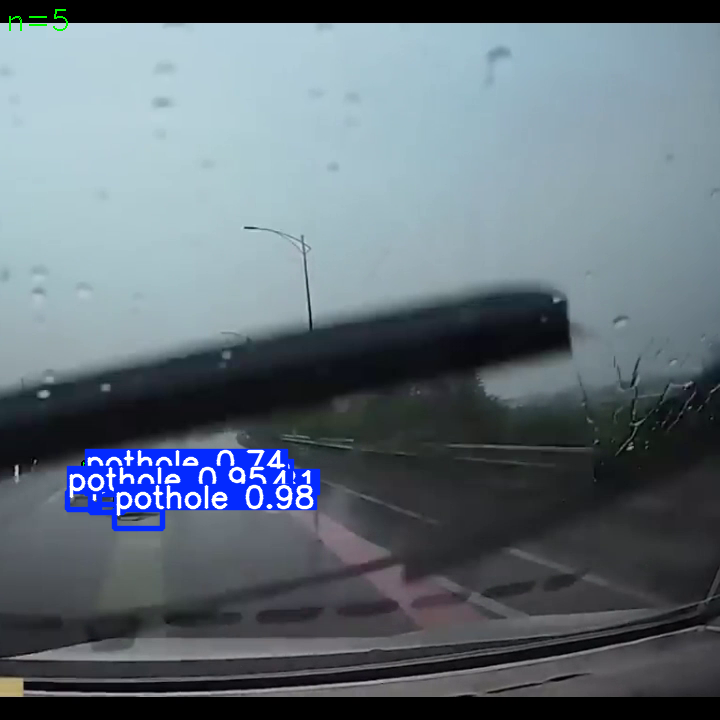

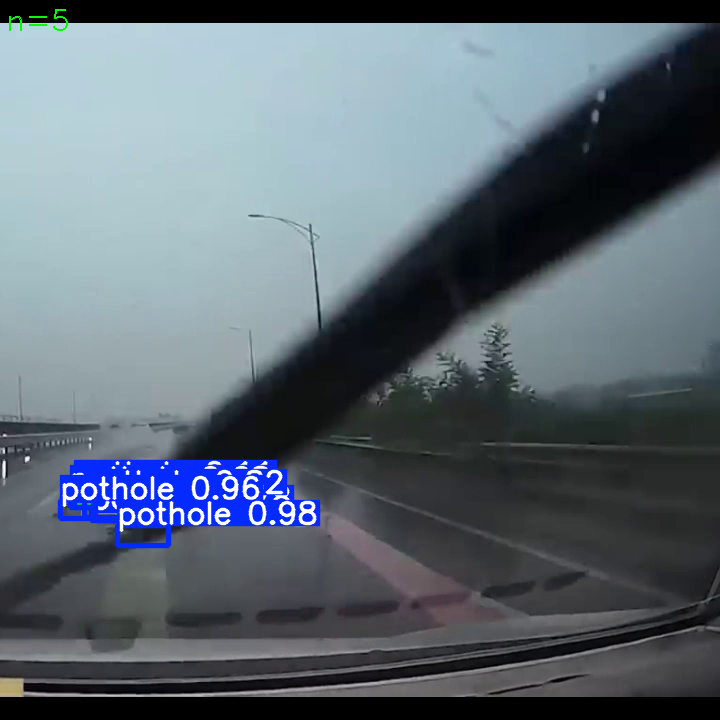

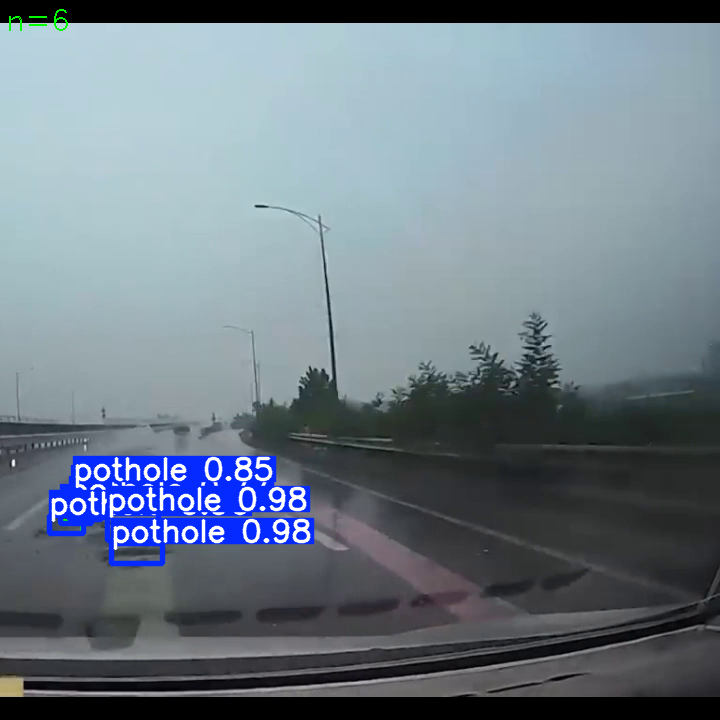

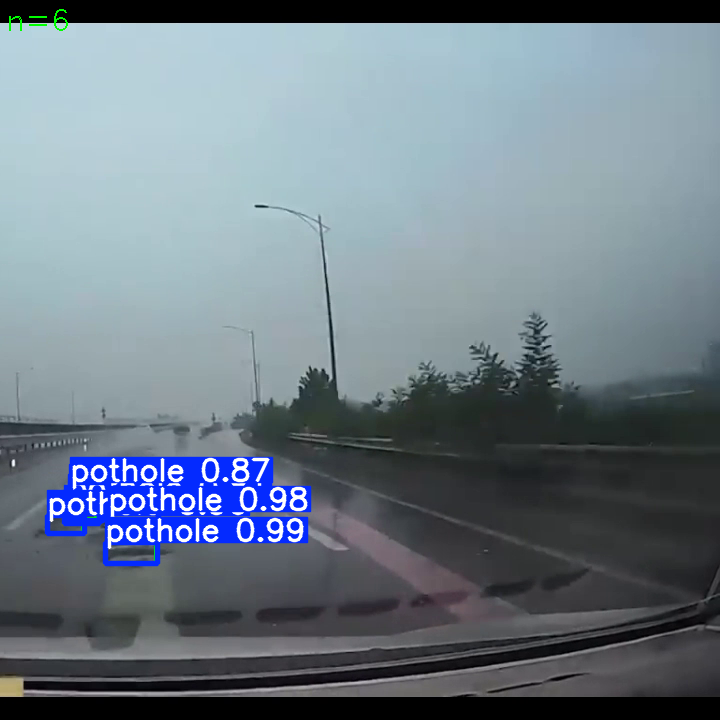

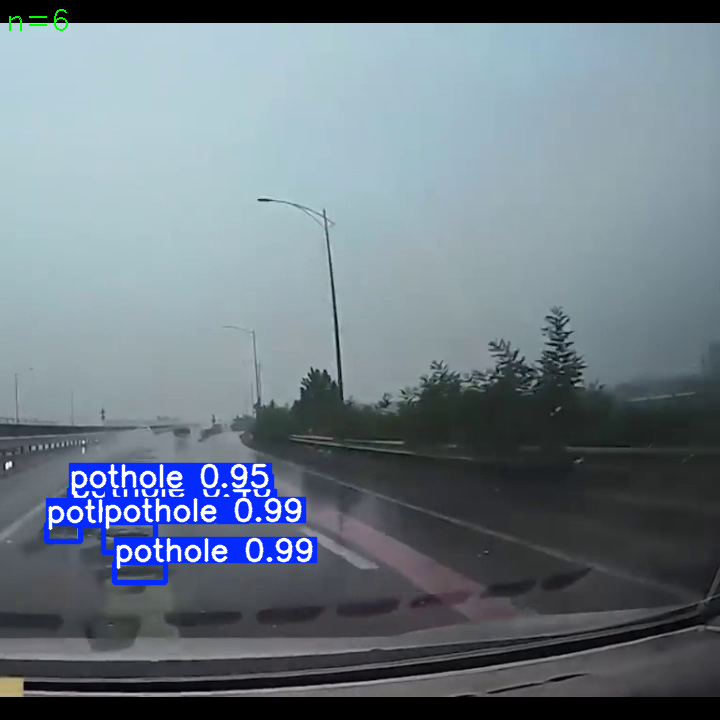

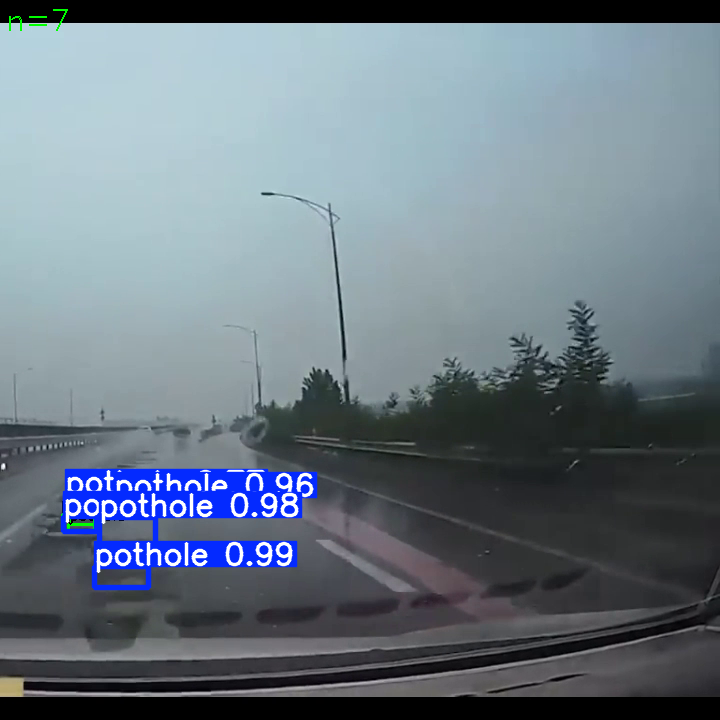

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/drive/MyDrive/yolov5/runs/detect/exp/*.png')[:10]: #이미지 파일 형식에 맞춰 .png 또는 .jpg 등으로 수정
    display(Image(filename=imageName))
    print("\n")